# Fast metadata-driven Moon + Zodi continuum model

> **What this notebook does.** It predicts the **Moon + zodiacal-light continuum** on the native LVM wavelength grid from exposure metadata, wavelength, and LSF. Observed flux is **not required at inference time**. The expensive geometry/template preparation is host-side; the prepared spectral basis, analytic correction, loss, gradients, and optimization are JAX x64 compatible.
>
> **Current status.** The frozen experiment contains **356 spectra from 52 nights**, sampled at **12,401 pixels from 3600 to 9800 Å in 0.5 Å steps**. Five-fold MJD-held-out validation **does not meet the requested 5% accuracy gate**, so this is a diagnostic model, not a production-quality sky prediction. Gallery spectra use out-of-fold (OOF) parameters; `frozen_parameters.json` is the separate all-data fit used for runtime evaluation.

## Model in one line

For exposure $e$ and wavelength $\lambda$,

$$
\boxed{P_e(\lambda)=M_e(\lambda)+Z_e(\lambda)}
$$

where $M_e$ is scattered moonlight and $Z_e$ is zodiacal light. There is **one shared 12-parameter calibration for the whole corpus**: no fitted per-exposure normalization, cloud term, telescope-label term, or spline.

| Stage | Inputs | Operation | Output |
|---|---|---|---|
| Geometry | `META.date_obs`, Far-Sky RA/Dec, exposure time | DE432s ephemeris at exposure midpoint | Moon/Sun positions, phase, separation, distances, airmasses, ecliptic coordinates |
| Instrument | `WAVE`, row of `LSF_SKY_FAR` | LSF convolution and detector-pixel integration | native-grid projection $\Pi_e$ |
| Physical basis | solar spectrum, ROLO, atmosphere defaults, geometry | analytic single scattering | Rayleigh $R_e$, aerosol $A_e$, fixed Zodi $Z_e$ |
| Shared calibration | header-derived geometry + 12 fitted constants | positive amplitude/colour correction | Moon $M_e$ and total $P_e$ |

## 1. Inputs and fixed physical basis

Define

$$
q=\frac{\lambda}{5000\,\mathrm{Å}},\qquad
x=\ln q,\qquad
\mu=\cos\rho,
$$

where $X_t$ is target airmass, $X_m$ is Moon airmass, and $\rho$ is Moon-target separation. The aerosol and total optical depths are

$$
\tau_A(\lambda)=0.0336\,q^{-1.38},
\qquad
\tau(\lambda)=\tau_R(\lambda)+\tau_A(\lambda).
$$

The stable single-scattering path factor is

$$
\Phi(d)=\frac{1-e^{-d}}{d},
\qquad
W_e(\lambda)=X_t e^{-\tau X_t}
\Phi\!\left(\tau[X_m-X_t]\right),
$$

with the analytic $d\rightarrow0$ limit used in code. The high-resolution lunar carrier is the 2 km s$^{-1}$-sampled Meftah solar spectrum, Doppler-shifted using the exposure geometry, multiplied by ROLO lunar albedo and the Sun-Moon/Moon-observer distance factor. It is zeroed when the Moon is below the horizon. A simple blue correction is

$$
B_e(\lambda)=
\frac{1+3.5X_t\tau_R(\lambda)}
     {1+3.5X_t\tau_R(5000\,\mathrm{Å})}.
$$

With $C_e(\lambda)$ denoting the lunar carrier, $P_R$ the Rayleigh phase function, $P_{\rm HG}$ the Henyey-Greenstein phase function, and $\omega_A=0.97$,

$$
R_e=\Pi_e\!\left[C_e W_e\tau_R P_R(\mu)B_e\right],
$$

$$
A_e=\Pi_e\!\left[C_e W_e\omega_A\tau_A
P_{\rm HG}(\mu;g=0.8)B_e\right].
$$

The zodiacal-light basis is

$$
Z_e=\Pi_e\!\left[
b_{500,e}\frac{10^{-8}}{1000}
\frac{S_{\odot,\mathrm{zodi}}(\lambda)}{S_\odot(5000\,\mathrm{Å})}
q^{0.26}
\exp\!\left(-X_t[0.5\tau_R+0.5\tau_A]\right)
\right].
$$

$b_{500,e}$ comes from interpolation of the Leinert map at the header-derived ecliptic geometry. The Zodi solar carrier is broadened by 30 km s$^{-1}$ and shifted by the analytic Zodi velocity. $\Pi_e$ includes the measured LSF, pixel integration, and conversion to one 35.3-arcsec Far-Sky fibre.

## 2. Shared empirical correction

The positive A3 calibration modifies only the Moon basis:

$$
M_e(\lambda)=
\left[e^{p_0}R_e(\lambda)+e^{p_1}A_e(\lambda)\right]
\exp\!\left[a_e+c_ex+p_7x^2\right],
$$

$$
a_e=p_2\ln X_t+p_3\ln\max(X_m,1)
+p_4\frac{|\phi|}{180}+p_5(\mu-0.5),
$$

$$
c_e=p_6+p_8\ln X_t+p_9\ln\max(X_m,1)
+p_{10}\frac{\phi}{180}+p_{11}(\mu-0.5),
$$

where $\phi$ is signed lunar phase in degrees. This correction is deliberately smooth and analytic: it changes the global scale, colour slope, and colour curvature while preserving the high-resolution solar absorption structure already present in $R_e$ and $A_e$.

### Frozen all-data parameters

| Parameter | Value | Meaning |
|---|---:|---|
| $p_0$ `log_rayleigh_scale` | 0.59870 | Rayleigh multiplier $e^{p_0}=1.82$ |
| $p_1$ `log_aerosol_scale` | -1.09861 | aerosol multiplier $e^{p_1}=0.333$; **at lower bound** |
| $p_2$ `amplitude_log_target_airmass` | 0.05771 | amplitude vs. target airmass |
| $p_3$ `amplitude_log_moon_airmass` | -0.02758 | amplitude vs. Moon airmass |
| $p_4$ `amplitude_abs_phase` | 0.18464 | amplitude vs. absolute phase |
| $p_5$ `amplitude_cos_separation` | 0.16107 | amplitude vs. separation |
| $p_6$ `color_log_wave` | 0.50406 | global colour slope |
| $p_7$ `color_log_wave_squared` | 1.27241 | global colour curvature |
| $p_8$ `color_target_airmass` | 0.21621 | colour vs. target airmass |
| $p_9$ `color_moon_airmass` | -0.15517 | colour vs. Moon airmass |
| $p_{10}$ `color_signed_phase` | -0.03640 | colour vs. signed phase |
| $p_{11}$ `color_cos_separation` | -0.39551 | colour vs. separation |

### What is physical and what is assumed

| Physically/instrument motivated | Simplified empirical assumptions |
|---|---|
| high-resolution solar absorption spectrum and Doppler shifts | blue factor $B_e$ |
| ROLO phase-dependent lunar albedo and ephemeris distances | fixed aerosol state instead of measured atmospheric metadata |
| Rayleigh optical depth/phase function and analytic scattering geometry | fixed Zodi colour and 0.5/0.5 extinction path fractions |
| Leinert Zodi brightness map and exposure ecliptic geometry | 12 shared A3 amplitude/colour coefficients |
| measured per-exposure LSF and native detector integration | no clouds, transparency, stray light, diffuse airglow, or per-exposure amplitude |

There are **no atmospheric measurements in the headers**. The model therefore fixes: pressure 744 hPa, Rayleigh depolarization 0.0148, `AOD500=0.0336`, aerosol exponent 1.38, single-scattering albedo 0.97, HG $g=0.8$, blue coefficient 3.5, Zodi scale 1, Zodi colour exponent 0.26, and equal 0.5/0.5 Zodi extinction fractions. These are defaults, not measurements of a particular exposure. The aerosol coefficient hitting its bound is model tension, not an inferred aerosol optical depth.

## 3. Training target, skyline suppression, and fit

Observed flux is used only during training. Each spectrum is independently decomposed by `SkyDecompLSFSurfaceIterative` using four continuum/lines/LSF refinement cycles. The fitted OH, atomic, Orc, and O2 emission components are subtracted:

$$
y_e(\lambda)=F_{{\rm SKY\_FAR},e}(\lambda)-
\left[L_{{\rm OH},e}+L_{{\rm atomic},e}+L_{{\rm Orc},e}+L_{{\rm O2},e}\right].
$$

The baseline `moon`, `diffuse`, `HO2`, `FeO`, and `O2Ac` continua help stabilize that decomposition but are **not subtracted**. Thus $y_e$ is a line-subtracted **total continuum**, not a pure measurement of Moon+Zodi; it may retain diffuse airglow, integrated starlight, variable transparency/scattering, instrumental continuum, and calibration residuals.

Skyline locations retain reference lines carrying 99% of each line group's strength and are expanded by $\pm2$ Å. Their weights are multiplied by **0.0005** even after line subtraction. Outside those regions, a channel-wise 3-sigma Huber multiplier suppresses large residuals; positive weights are normalized to mean one within each B/R/Z decomposition channel. In this corpus, 60.87% of native pixels are skyline-covered.

After dividing all fluxes by the fixed numerical scale $10^{-15}$, define $\epsilon_e=0.02\,\mathrm{median}(y_e)$ on line-free pixels and

$$
r_{e\lambda}=
\frac{2[P_{e\lambda}-y_{e\lambda}]}
{\max(P_{e\lambda}+y_{e\lambda}+\epsilon_e,\epsilon_e)}.
$$

The optimized objective is

$$
H_{0.05}(r)=0.05^2\left[\sqrt{1+(r/0.05)^2}-1\right],
$$

$$
\mathcal{L}=\sum_e w_{{\rm night}(e)}
\frac{\sum_\lambda w_{e\lambda}H_{0.05}(r_{e\lambda})}
     {\sum_\lambda w_{e\lambda}},
$$

with equal total weight per MJD. Each of five MJD-grouped folds, and the final all-data fit, uses bounded L-BFGS-B with JAX `jit(value_and_grad)`, eight deterministic starts, seed `20260805`, and at most 500 iterations. No exposure-specific flux scale is fitted.

## 4. Validation result and interpretation

OOF E50 is measured on positive, finite, non-skyline native pixels:

| Band | Range (Å) | median E50 | p90 E50 | Result |
|---|---:|---:|---:|---|
| B | 3600–5800 | 7.07% | 15.49% | fail |
| R | 5800–7550 | 6.55% | 14.75% | fail |
| Z | 7550–9800 | 9.25% | 21.63% | fail |

The fold split tests transfer of the **shared 12 parameters** to other nights. It is not an end-to-end raw-sky test because the held-out observed spectrum is still used to construct its line-subtracted target and robust weights. Exposure 11381 is the clearest failure: its continuum state is far above the metadata-only Moon+Zodi prediction, indicating missing exposure-dependent continuum/transparency/stray-light information rather than a plotting problem.

## 5. Minimal use

Evaluate the frozen model using metadata and LSF only:

```python
import json

from skysub.experiments_moon_zodi_baseline_decomp_jax_v1 import model

OUTPUT = model.OUTPUT_DIR
provenance = json.loads((OUTPUT / "decomposition_provenance.json").read_text())
payload = json.loads((OUTPUT / "frozen_parameters.json").read_text())

parameters = model.previous.FrozenParameters(
    payload["family"], tuple(payload["values"])
)
spectrum = model.corpus_model.load_spectrum(
    provenance["source_stack"], exposure=11381, load_flux=False
)
result = model.previous.AnalyticMoonZodiModel(parameters).evaluate(spectrum)

moon = result.moon
zodi = result.zodi
moon_plus_zodi = result.total
```

Rebuild this isolated experiment from `sky_subtract/lvmsky/`:

```bash
python -m skysub.experiments_moon_zodi_baseline_decomp_jax_v1.model prepare --n-workers 4
python -m skysub.experiments_moon_zodi_baseline_decomp_jax_v1.model fit
python -m skysub.experiments_moon_zodi_baseline_decomp_jax_v1.model render
```

`prepare` performs the per-spectrum baseline decomposition, `fit` derives the shared parameters and OOF predictions, and `render` only regenerates figures. The 20 Å panels below are display-only medians; fitting and scientific metrics always use the native 0.5 Å grid.


In [1]:
from pathlib import Path
import json
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from astropy.io import fits
from IPython.display import Image, display

working_directory = Path.cwd().resolve()
search_roots = (working_directory, *working_directory.parents)
lvmsky_root = next(
    (
        root if (root / "skysub").is_dir() else root / "lvmsky"
        for root in search_roots
        if (root / "skysub").is_dir() or (root / "lvmsky" / "skysub").is_dir()
    )
)
if str(lvmsky_root) not in sys.path:
    sys.path.insert(0, str(lvmsky_root))

from skysub.experiments_moon_zodi_baseline_decomp_jax_v1 import model  # noqa: E402

OUTPUT = model.OUTPUT_DIR
summary = json.loads((OUTPUT / "fit_results.json").read_text())
provenance = json.loads((OUTPUT / "decomposition_provenance.json").read_text())
parameters = pd.read_csv(OUTPUT / "parameter_table.csv")
decomposition = pd.read_csv(OUTPUT / "decomposition_metrics.csv")
per_exposure = pd.read_csv(OUTPUT / "per_exposure_oof_metrics.csv")
print("Python:", sys.executable)
summary["status"], summary["n_spectra"], summary["n_nights"]

Python: /opt/homebrew/Caskroom/miniconda/base/envs/lvmdrp_dev_311/bin/python


('failed_5pct_gate', 356, 52)

## Stored contract and provenance

The first cell describes the method. These tables expose the exact machine-readable contract, native grid, source stack, selection, and decomposition cache used by this run.

In [2]:
contract = pd.Series(summary["approved_contract"], name="value")
display(contract.to_frame())
display(pd.Series(provenance["grid"], name="value").to_frame())
print("Source stack:", provenance["source_stack"])
print("Decomposition cache SHA-256:", provenance["cache_sha256"])

,value
cohort,unchanged strict 356-spectrum lunar cohort
target,observed FLUX_SKY_FAR minus baseline OH+atomic...
grid,unchanged 12401-pixel source wavelength grid
fit_range_angstrom,"[3600.0, 9800.0]"
weights,baseline LSF-surface iterative continuum weights
line_weight,0.0005
per_exposure_fitted_normalization,False
split,five folds grouped by MJD
model,unchanged analytic A3 Moon+fixed-Zodi family


,value
n_pixels,12401
minimum_angstrom,3600.0
maximum_angstrom,9799.999023
sampling_angstrom,0.5
dtype,float64


Source stack: /Users/ik52/obs/sas/sdsswork/users/u6058164/lvmsframe_median_stack_1.2.1.fits
Decomposition cache SHA-256: 8d1525039f3a5f2ea261658df531fe14a25e47eb3f5aa95af02b1af7f6e227ba


## Frozen all-data parameters

This table is the runtime all-data fit. The spectral galleries and held-out metrics below use fold-specific OOF parameters instead.

In [3]:
display(parameters.style.format({"value": "{:.6g}", "lower_bound": "{:.4g}", "upper_bound": "{:.4g}"}))

,name,value,lower_bound,upper_bound,role
0,log_rayleigh_scale,0.598698,-1.099,1.099,shared fitted parameter
1,log_aerosol_scale,-1.09861,-1.099,1.099,shared fitted parameter
2,amplitude_log_target_airmass,0.0577053,-1,1,shared fitted parameter
3,amplitude_log_moon_airmass,-0.0275801,-1,1,shared fitted parameter
4,amplitude_abs_phase,0.184643,-1,1,shared fitted parameter
5,amplitude_cos_separation,0.161074,-1,1,shared fitted parameter
6,color_log_wave,0.504064,-1.5,1.5,shared fitted parameter
7,color_log_wave_squared,1.27241,-5,5,shared fitted parameter
8,color_target_airmass,0.216215,-1.5,1.5,shared fitted parameter
9,color_moon_airmass,-0.155172,-1.5,1.5,shared fitted parameter


## Night-held-out accuracy summary

Each exposure is predicted by the fold that excluded its entire MJD. These summary values are computed from the resulting 356 OOF predictions, not from the final all-data fit.

In [4]:
metric_rows = []
for band, values in summary["oof_band_metrics"].items():
    metric_rows.append({"band": band, **values})
metrics = pd.DataFrame(metric_rows)
display(metrics.style.format({
    "median_e50": "{:.2%}",
    "p90_e50": "{:.2%}",
    "median_e90": "{:.2%}",
    "median_bias": "{:.2%}",
    "fraction_e50_le_5pct": "{:.1%}",
}))

,band,median_e50,p90_e50,median_e90,median_bias,fraction_e50_le_5pct,passed,median_line_free_pixels_per_spectrum
0,B,7.07%,15.49%,15.24%,4.19%,26.7%,False,3701
1,R,6.55%,14.75%,12.19%,0.34%,36.8%,False,828
2,Z,9.25%,21.63%,16.59%,2.56%,16.3%,False,323


## Baseline decomposition audit

In [5]:
display(pd.Series({
    "spectra": len(decomposition),
    "successful": decomposition["status"].isin(["Solved", "AlmostSolved"]).sum(),
    "median runtime (s)": decomposition["elapsed_seconds"].median(),
    "maximum closure error": decomposition["closure_max_abs"].max(),
    "skyline fraction": decomposition["skyline_fraction"].median(),
    "median continuum weight": decomposition["weight_median"].median(),
}, name="value").to_frame())

,value
spectra,356.000000
successful,356.000000
median runtime (s),5.586084
maximum closure error,0.000000
skyline fraction,0.608741
median continuum weight,0.006721


## Pixel-weight ingredient

The line-subtracted target still contains imperfect residuals near bright skylines. Those pixels remain on the native grid but contribute very little to the shared continuum fit.

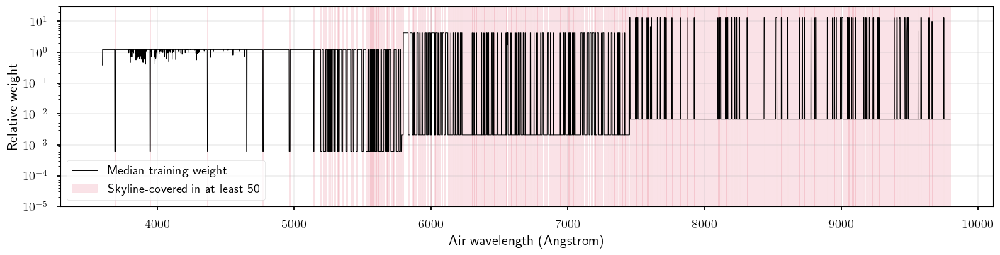

In [6]:
with np.load(OUTPUT / "baseline_decomposition.npz", allow_pickle=False) as cache:
    wave = cache["wave"]
    skyline_fraction = np.mean(cache["skyline_mask"].astype(bool), axis=0)
    median_weight = np.median(cache["weights"], axis=0)

figure, axis = plt.subplots(figsize=(14, 3.5), constrained_layout=True)
axis.plot(wave, median_weight, color="black", lw=0.7, label="Median training weight")
axis.fill_between(wave, 1e-5, 30.0, where=skyline_fraction >= 0.5, color="crimson", alpha=0.12, label="Skyline-covered in at least 50% of spectra")
axis.set(yscale="log", xlabel="Air wavelength (Angstrom)", ylabel="Relative weight", ylim=(1e-5, 30.0))
axis.grid(alpha=0.2)
axis.legend()
plt.show()

## Analytic Moon and Zodi ingredients

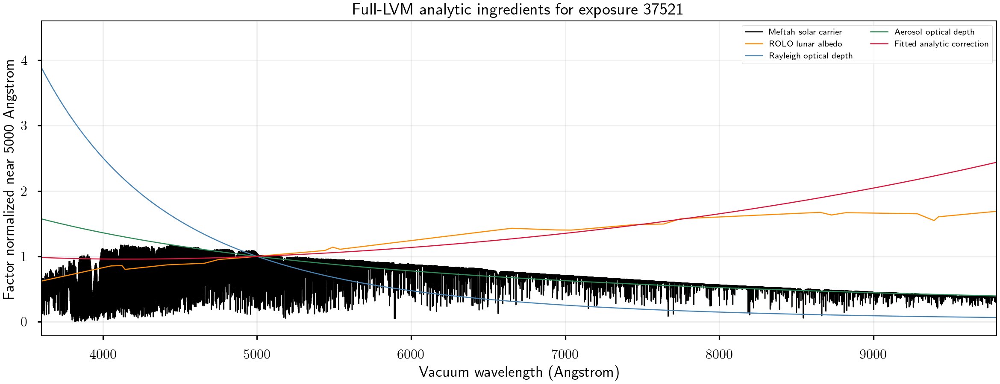

In [7]:
display(Image(filename=str(OUTPUT / "analytic_ingredients.png"), width=1300))

## Twenty held-out native-grid examples

The same frozen manifest of 20 OOF spectra is used throughout the notebook. In each upper pair, both panels have the **same y-range**, determined only from the 1st--99th percentiles of the line-free continuum target; raw skyline peaks are intentionally clipped. Observed data are black, and the Moon+Zodi continuum model is crimson and plotted topmost. Emission-line model components are intentionally omitted. Both lower panels show the algebraically identical continuum residual with a shared range of `+/-7` ordinary RMS, where RMS is computed after excluding persisted skyline-covered pixels.

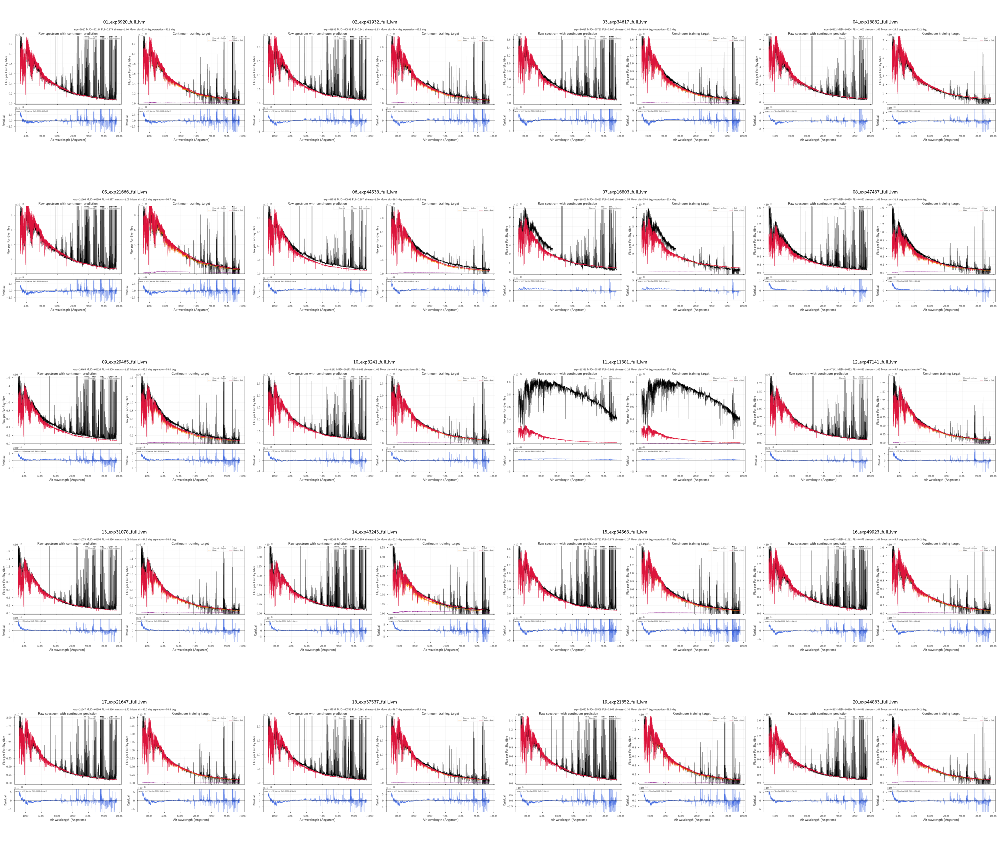

In [8]:
display(Image(filename=str(OUTPUT / "examples_contact_sheet.png"), width=1500))

## Large individual native-grid views

The first ten manifest examples are repeated at full size. The 20-example contact sheet above contains the complete fixed selection, including the worst OOF stress case `exp=11381`.

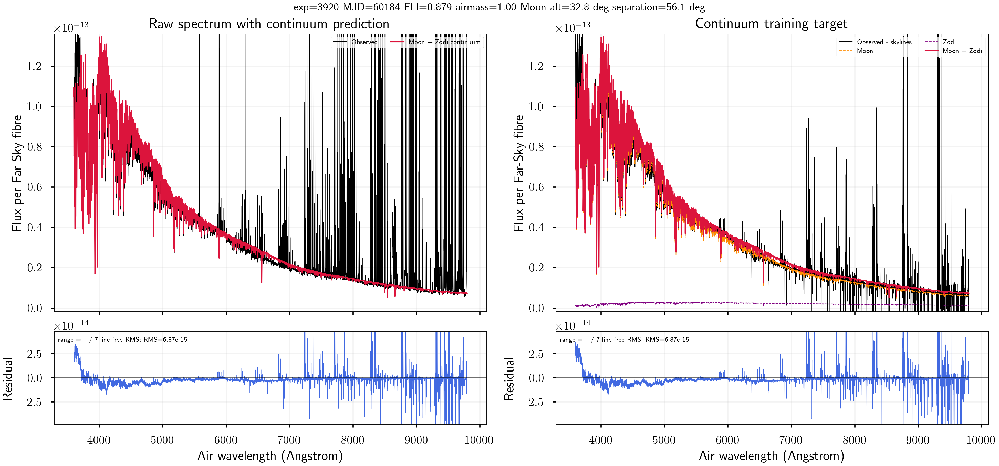

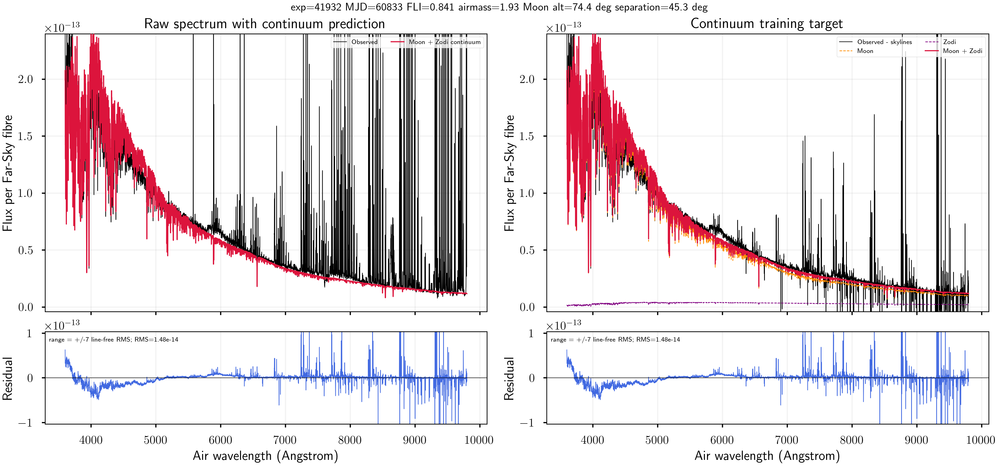

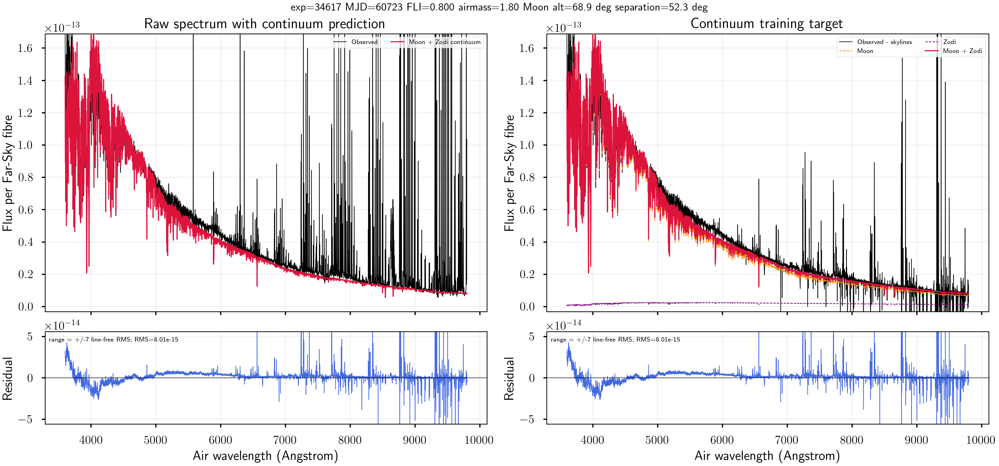

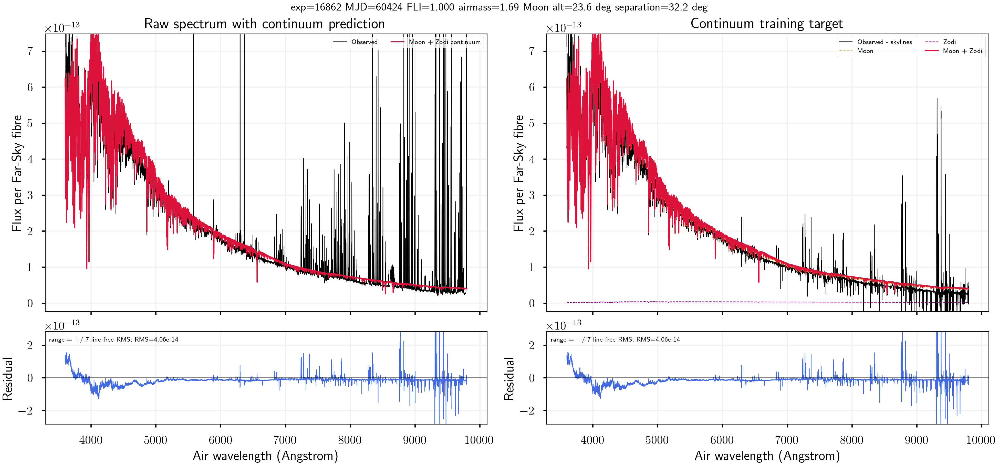

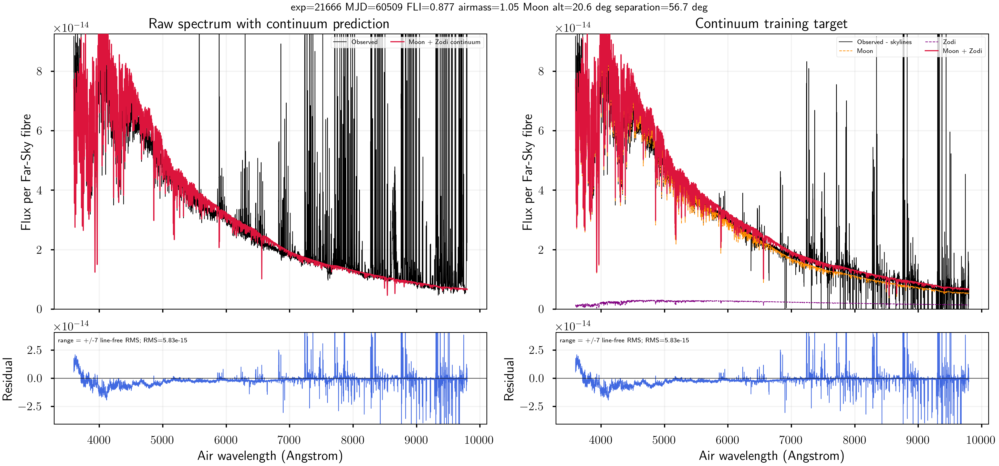

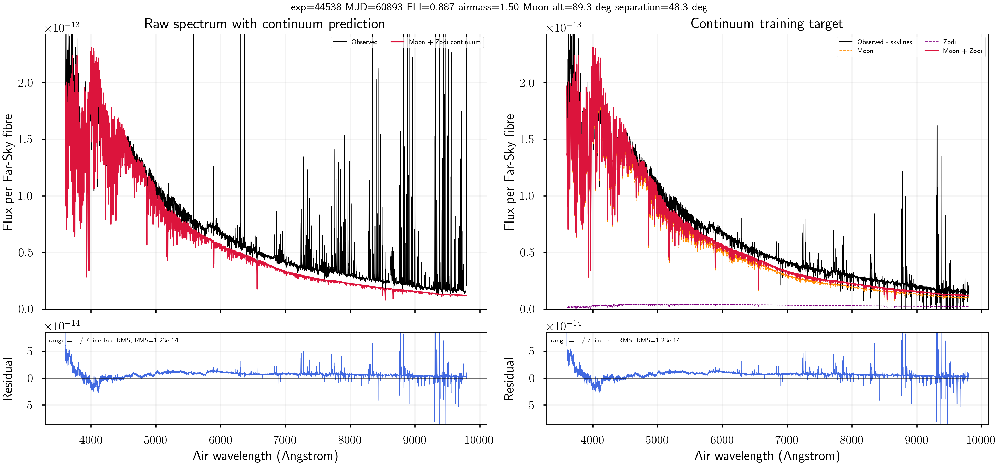

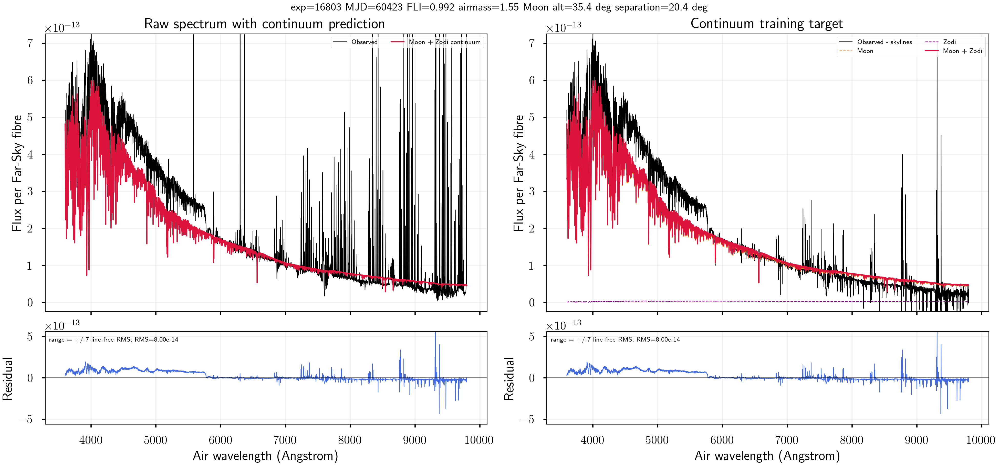

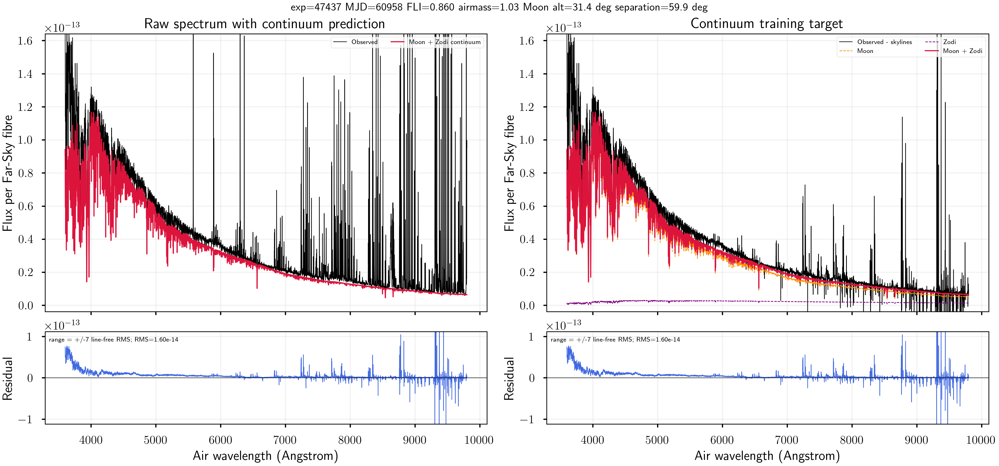

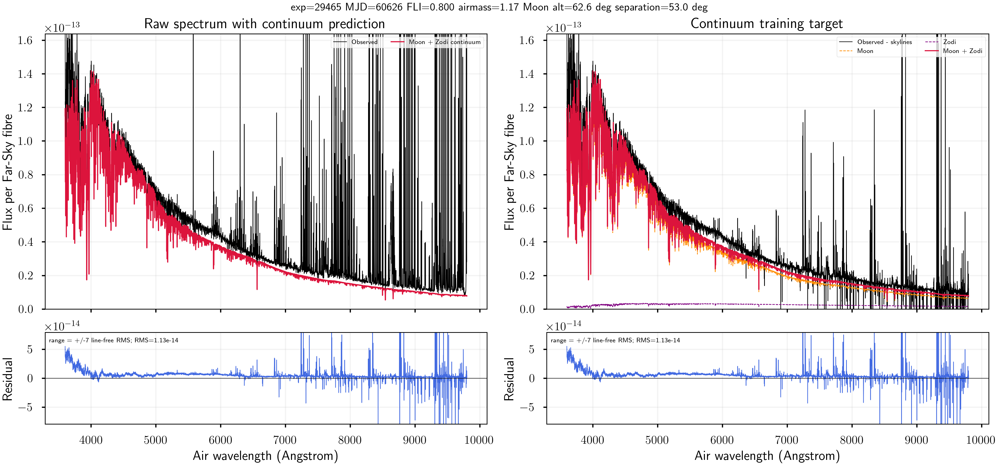

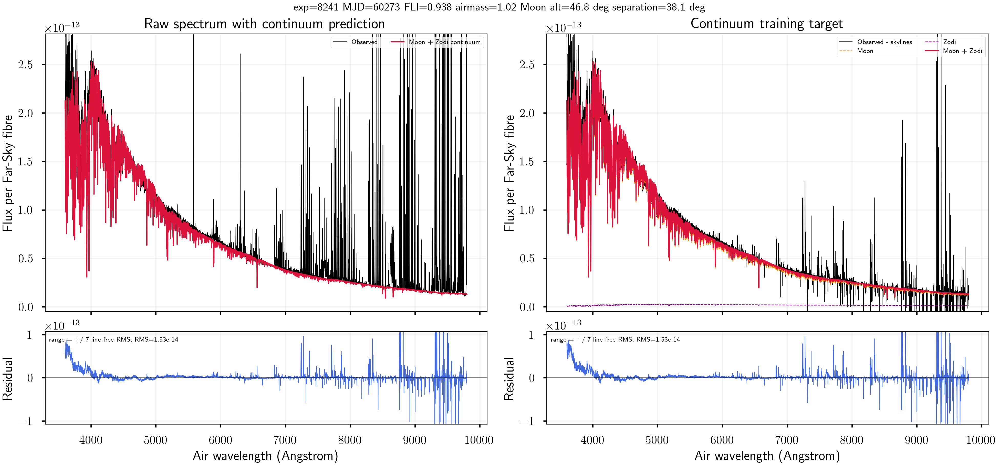

In [9]:
example_manifest = pd.read_csv(OUTPUT / "example_manifest.csv")
example_paths = [OUTPUT / "examples" / name for name in example_manifest["filename"]]
for path in example_paths[:10]:
    display(Image(filename=str(path), width=1450))

## Why exposure 11381 fails

`exp=11381` is not a row-mapping or plotting error. Its baseline decomposition is `Solved`, the line-subtraction closure is exact at cached precision, and the line model is negligible between skylines. The broad excess already exists in raw `FLUX_SKY_FAR`. The table below compares all strict-cohort spectra from MJD 60337 over the relatively clean 5200--5400 Angstrom interval. Lunar geometry changes smoothly, while the fixed Far-Sky field changes by factors of several; `FLUX_SKY_NEAR` and `FLUX_SCI` remain near the ordinary level. The artifacts therefore support an unresolved exposure/night-specific Far-Sky continuum state, but cannot distinguish cloud/aerosol-enhanced scattered moonlight from instrumental, flux-calibration, or stray-light contamination. The stress case is retained rather than silently removed or repaired with a forbidden per-exposure amplitude.

,exposure,sky_far,sun_alt_deg,moon_sep_deg,target/model,far/near,line/target,mean_E50_pct
0,11375,SkyW,-41.0,28.25,4.82,8.10,4.82e-05,80.8
1,11376,SkyW,-39.8,28.17,4.66,6.71,5.18e-05,80.0
2,11377,SkyW,-38.4,28.09,2.01,2.67,1.02e-04,47.7
3,11378,SkyE,-36.6,28.01,2.00,2.83,9.71e-05,48.9
4,11379,SkyW,-34.7,27.93,3.23,4.56,6.50e-05,71.7
5,11380,SkyE,-32.5,27.84,4.41,4.97,5.72e-05,79.4
6,11381,SkyW,-30.2,27.76,9.20,8.59,2.66e-05,89.9
7,11382,SkyW,-27.7,27.68,3.01,2.80,6.81e-05,69.8
8,11383,SkyE,-25.0,27.60,1.98,2.04,1.02e-04,48.7
9,11384,SkyW,-22.2,27.51,2.20,2.15,9.58e-05,52.4


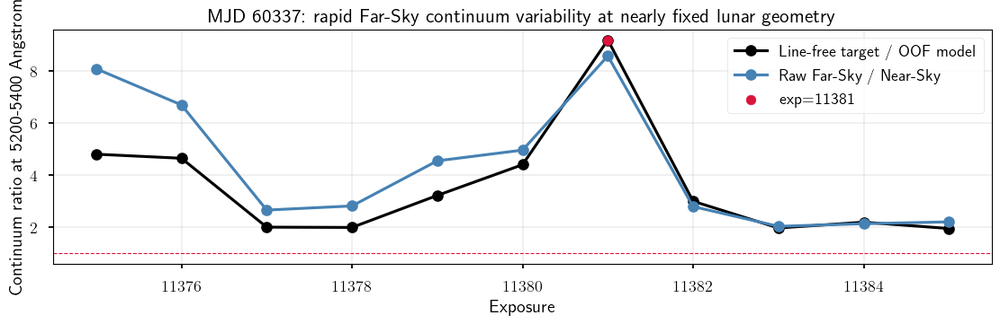

In [10]:
same_night = per_exposure.loc[per_exposure["mjd"].eq(60337)].sort_values("exposure").copy()
with np.load(OUTPUT / "baseline_decomposition.npz", allow_pickle=False) as cache:
    diagnostic_wave = cache["wave"].astype(float)
    cache_exposures = cache["exposures"].astype(int)
    target_cache = cache["target"].astype(float)
    line_cache = cache["line_model"].astype(float)
    skyline_cache = cache["skyline_mask"].astype(bool)
with np.load(OUTPUT / "oof_predictions.npz", allow_pickle=False) as predictions:
    oof_total_cache = predictions["total"].astype(float)

window = (diagnostic_wave >= 5200.0) & (diagnostic_wave < 5400.0)
cache_index = {int(exposure): index for index, exposure in enumerate(cache_exposures)}
diagnostic_rows = []
with fits.open(provenance["source_stack"], memmap=True, lazy_load_hdus=True) as hdul:
    for row in same_night.itertuples(index=False):
        index = cache_index[int(row.exposure)]
        clean = window & ~skyline_cache[index]
        stack_row = int(row.stack_row)
        meta = hdul["META"].data[stack_row]
        far_level = float(np.nanmedian(hdul["FLUX_SKY_FAR"].data[stack_row][window]))
        near_level = float(np.nanmedian(hdul["FLUX_SKY_NEAR"].data[stack_row][window]))
        target_level = float(np.nanmedian(target_cache[index, clean]))
        model_level = float(np.nanmedian(oof_total_cache[index, clean]))
        diagnostic_rows.append({
            "exposure": int(row.exposure),
            "sky_far": row.sky_far_label,
            "sun_alt_deg": float(meta["sun_alt"]),
            "moon_sep_deg": float(row.moon_separation_deg),
            "target/model": target_level / model_level,
            "far/near": far_level / near_level,
            "line/target": float(np.nanmedian(np.abs(line_cache[index, window]))) / target_level,
            "mean_E50_pct": 100.0 * np.mean([row.e50_b, row.e50_r, row.e50_z]),
        })

night_diagnostic = pd.DataFrame(diagnostic_rows)
display(night_diagnostic.style.format({
    "sun_alt_deg": "{:.1f}", "moon_sep_deg": "{:.2f}",
    "target/model": "{:.2f}", "far/near": "{:.2f}",
    "line/target": "{:.2e}", "mean_E50_pct": "{:.1f}",
}).apply(lambda row: ["background-color: #ffd6dc" if row["exposure"] == 11381 else "" for _ in row], axis=1))

figure, axis = plt.subplots(figsize=(11, 3.5), constrained_layout=True)
axis.plot(night_diagnostic["exposure"], night_diagnostic["target/model"], "o-", color="black", label="Line-free target / OOF model")
axis.plot(night_diagnostic["exposure"], night_diagnostic["far/near"], "o-", color="steelblue", label="Raw Far-Sky / Near-Sky")
axis.scatter([11381], night_diagnostic.loc[night_diagnostic["exposure"].eq(11381), "target/model"], color="crimson", s=60, zorder=5, label="exp=11381")
axis.axhline(1.0, color="crimson", ls="--", lw=0.8)
axis.set(xlabel="Exposure", ylabel="Continuum ratio at 5200-5400 Angstrom", title="MJD 60337: rapid Far-Sky continuum variability at nearly fixed lunar geometry")
axis.grid(alpha=0.2)
axis.legend()
plt.show()

## The same twenty spectra at 20 Angstrom diagnostic nodes

This second contact sheet uses the exact same `cohort_index` values and display order as the native-grid gallery. Observed data are black, and the Moon+Zodi continuum model is crimson; emission-line model components are intentionally omitted. Raw traces are medians of finite native pixels; continuum traces are medians of finite, non-skyline pixels. A node requires at least five eligible native samples. These 20 Angstrom products are display-only summaries: the fit, OOF parameter selection, and reported metrics use the original 0.5 Angstrom grid.

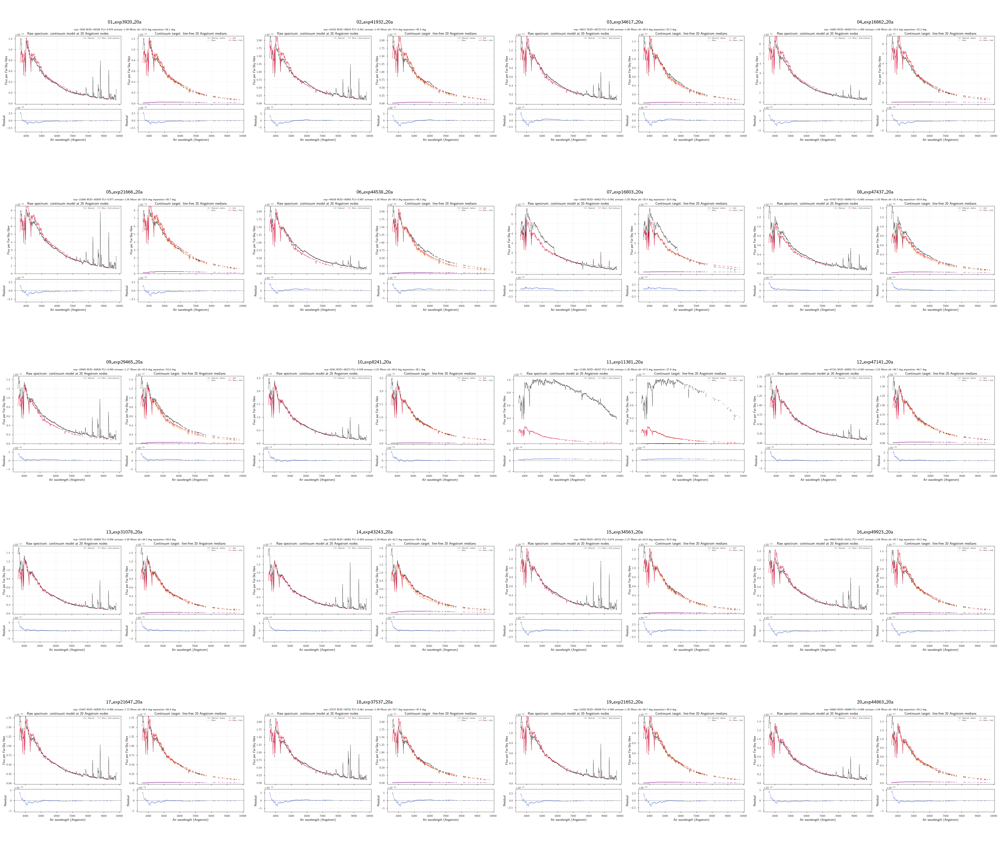

In [11]:
display(Image(filename=str(OUTPUT / "examples_20a_contact_sheet.png"), width=1500))

## What the B/R/Z held-out E50 histograms mean

Each histogram contains **one E50 number per spectrum for all 356 spectra**; it is not a histogram of pixels or wavelength bins. “Held out” means that the prediction came from the fold that excluded every spectrum with the same MJD. For exposure (e) and band (c),

\[
E50_{e,c}=\operatorname{median}_{\lambda\in c}
\left|\frac{P_{e\lambda}-y_{e\lambda}}
{\max[y_{e\lambda},\;0.02\,\operatorname{median}(y_e)]}\right|,
\]

using only positive, finite, non-skyline native pixels. B, R, and Z cover 3600--5800, 5800--7550, and 7550--9800 Angstrom. Lower is better. The dashed crimson line is the 5% exposure-level reference; the formal band gate additionally requires `p90(E50) <= 5%` and `abs(median bias) <= 2%`. Median usable pixel counts are 3701, 828, and 323 in B/R/Z, so the red bands have fewer constraint pixels. The condition table below describes the **20 displayed examples**, not the full cohort.

,count,mean,std,min,25%,50%,75%,max
target_airmass,20.0,1.333437,0.322642,1.004633,1.041384,1.263423,1.588485,1.926663
moon_fli,20.0,0.882850,0.051611,0.800000,0.859925,0.875450,0.889050,0.999900
moon_altitude_deg,20.0,54.046750,20.039015,20.607900,42.042225,49.271200,68.763525,89.288700
moon_separation_deg,20.0,48.953915,11.168555,20.373000,46.323875,52.980400,57.017050,59.936200
signed_phase_deg,20.0,13.260630,38.924024,-53.562178,-30.627980,39.552876,42.397314,53.334456


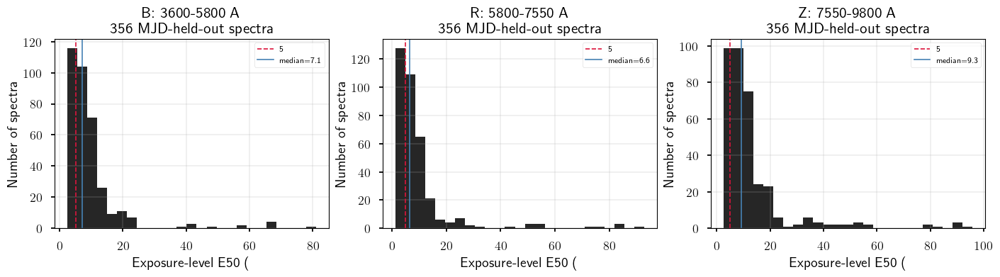

In [12]:
displayed_indices = example_manifest["cohort_index"].astype(int).to_numpy()
displayed_conditions = per_exposure.iloc[displayed_indices]
display(displayed_conditions[[
    "target_airmass", "moon_fli", "moon_altitude_deg",
    "moon_separation_deg", "signed_phase_deg",
]].describe().T)

band_ranges = {"B": "3600-5800 A", "R": "5800-7550 A", "Z": "7550-9800 A"}
figure, axes = plt.subplots(1, 3, figsize=(14, 3.8), constrained_layout=True)
for axis, band in zip(axes, "BRZ"):
    values = 100.0 * per_exposure[f"e50_{band.lower()}"]
    axis.hist(values, bins=25, color="black", alpha=0.85)
    axis.axvline(5.0, color="crimson", ls="--", lw=1.2, label="5% reference")
    axis.axvline(values.median(), color="steelblue", lw=1.2, label=f"median={values.median():.1f}%")
    axis.set(
        title=f"{band}: {band_ranges[band]}\n356 MJD-held-out spectra",
        xlabel="Exposure-level E50 (%)",
        ylabel="Number of spectra",
    )
    axis.grid(alpha=0.2)
    axis.legend(fontsize=8)
plt.show()

## Interpretation

The model captures the broad solar-carrier shape for many bright-Moon spectra but does not satisfy the 5% night-held-out gate. The strongest failure, MJD 60337 / exposure 11381, is a real raw Far-Sky continuum excess rather than a skyline-subtraction artifact. Available artifacts cannot identify whether the missing state is atmospheric cloud/aerosol scattering or instrumental/calibration stray light. Because no corresponding exposure-level condition proxy exists in the current headers, a deterministic metadata-only Moon+fixed-Zodi model cannot reproduce that rapid variation. The stress case is retained to keep the limitation visible.